In [1]:
import pathlib
from pathlib import Path
import pandas as pd

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Jan_28_19:32:09_PST_2021
Cuda compilation tools, release 11.2, V11.2.142
Build cuda_11.2.r11.2/compiler.29558016_0
torch:  1.13 ; cuda:  1.13.0
detectron2: 0.6


In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
#setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [4]:
setup_logger()

<Logger detectron2 (DEBUG)>

In [5]:
import matplotlib as mpl
import matplotlib.pyplot as plt 

%matplotlib inline

In [6]:
#original_folder = "valladolid_merida_8clases_25Oct2022"
#tmp_str = "coco_" + purpose

In [7]:
from detectron2.data.datasets import register_coco_instances

f = Path.cwd() / ("coco_" + "train") 
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_train", {}, str(l), str(d))

In [8]:
MetadataCatalog.get("my_dataset_train")

namespace(name='my_dataset_train',
          json_file='/home/jose/darknet/coco_train/labels.json',
          image_root='/home/jose/darknet/coco_train/data',
          evaluator_type='coco')

In [9]:
f = Path.cwd() / ("coco_" + "test")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_test", {}, str(l), str(d))

In [10]:
MetadataCatalog.get("my_dataset_test")

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco')

In [11]:
f = Path.cwd() / ("coco_" + "val")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_val", {}, str(l), str(d))

In [12]:
MetadataCatalog.get("my_dataset_val")

namespace(name='my_dataset_val',
          json_file='/home/jose/darknet/coco_val/labels.json',
          image_root='/home/jose/darknet/coco_val/data',
          evaluator_type='coco')

WARNING [11/24 06:37:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 06:37:32 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json


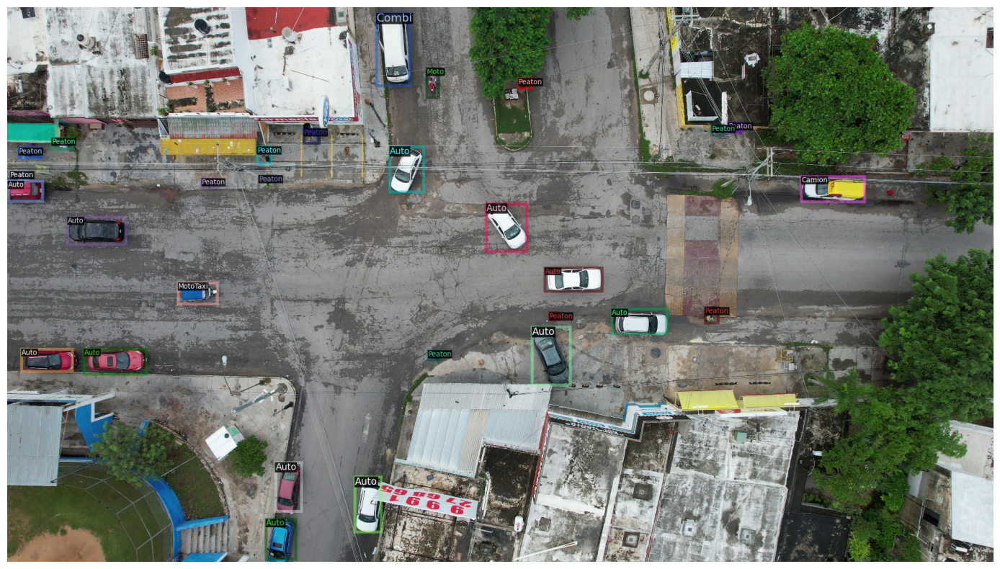

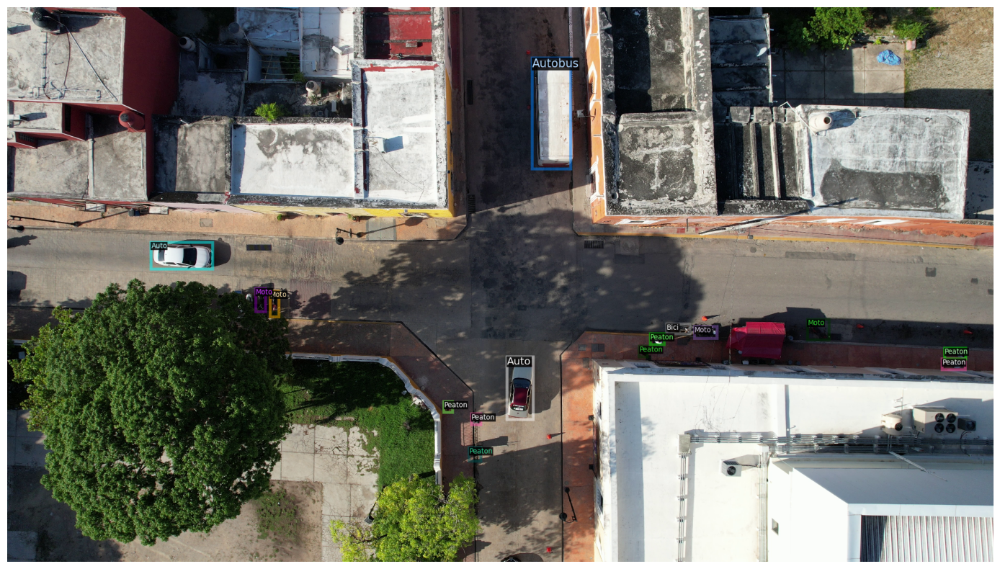

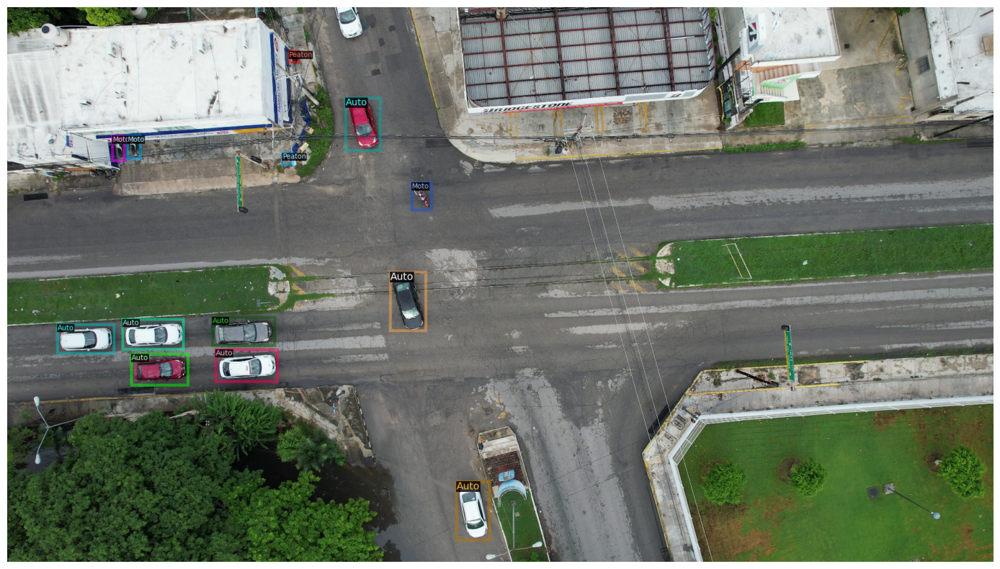

In [13]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")

dataset_dicts = DatasetCatalog.get("my_dataset_train")
#print("hi")
import random
from detectron2.utils.visualizer import Visualizer


for d in random.sample(dataset_dicts, 3):
    
    img = cv2.imread(d["file_name"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #print(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    #cv2_imshow(vis.get_image()[:, :, ::-1])
    #cv2.imshow("img", vis.get_image()[:, :, ::-1])
    #Image(d["file_name"])
    #Image(vis.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()

In [14]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [16]:
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
#https://github.com/facebookresearch/detectron2/blob/main/configs/COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml
#https://github.com/facebookresearch/detectron2/blob/main/configs/COCO-Detection/faster_rcnn_R_101_DC5_3x.yaml
#https://github.com/facebookresearch/detectron2/blob/main/configs/COCO-Detection/faster_rcnn_R_101_C4_3x.yaml

cfg.SOLVER.WARMUP_ITERS = 500 # va subiendo lr desde 0
cfg.SOLVER.MAX_ITER = 1800 #1500 #adjust up if val mAP is still rising, adjust down if overfit

cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05


cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 8 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 200

cfg.OUTPUT_DIR = "./output_5"


In [17]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/24 06:41:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

WARNING [11/24 06:41:08 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 06:41:08 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json
[11/24 06:41:08 d2.data.build]: Removed 0 images with no usable annotations. 1935 images left.
[11/24 06:41:08 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 10668        |  Autobus   | 278          |    Bici    | 1255         |
|   Camion   | 2192         |   Combi    | 387          |    Moto    | 5304         |
|  MotoTaxi  | 301          |   Peaton   | 8994         |            |              |
|   total    | 29379        |            |              |            |              |
[11/24 06:41:08 d2.data.dataset_mapper]: [Datase

model_final_298dad.pkl: 212MB [00:04, 42.7MB/s]                                 
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (9, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (32, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (32,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads

[11/24 06:41:13 d2.engine.train_loop]: Starting training from iteration 0


/home/jose/miniconda3/envs/f1/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666643004612/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/24 06:41:26 d2.utils.events]:  eta: 0:15:41  iter: 19  total_loss: 2.88  loss_cls: 2.072  loss_box_reg: 0.6863  loss_rpn_cls: 0.09901  loss_rpn_loc: 0.04715  time: 0.5405  data_time: 0.0869  lr: 3.8962e-05  max_mem: 4665M
[11/24 06:41:37 d2.utils.events]:  eta: 0:15:39  iter: 39  total_loss: 2.237  loss_cls: 1.424  loss_box_reg: 0.7097  loss_rpn_cls: 0.06465  loss_rpn_loc: 0.0388  time: 0.5369  data_time: 0.0448  lr: 7.8922e-05  max_mem: 4665M
[11/24 06:41:47 d2.utils.events]:  eta: 0:15:24  iter: 59  total_loss: 1.646  loss_cls: 0.8268  loss_box_reg: 0.6947  loss_rpn_cls: 0.04199  loss_rpn_loc: 0.04055  time: 0.5324  data_time: 0.0418  lr: 0.00011888  max_mem: 4665M
[11/24 06:41:58 d2.utils.events]:  eta: 0:15:07  iter: 79  total_loss: 1.409  loss_cls: 0.632  loss_box_reg: 0.7436  loss_rpn_cls: 0.03266  loss_rpn_loc: 0.03668  time: 0.5290  data_time: 0.0299  lr: 0.00015884  max_mem: 4665M
[11/24 06:42:08 d2.utils.events]:  eta: 0:14:55  iter: 99  total_loss: 1.362  loss_cls: 0.543

[11/24 06:44:05 d2.utils.events]:  eta: 0:13:40  iter: 239  total_loss: 0.8454  loss_cls: 0.3058  loss_box_reg: 0.5056  loss_rpn_cls: 0.02142  loss_rpn_loc: 0.03428  time: 0.5286  data_time: 0.0174  lr: 0.00047852  max_mem: 4665M
[11/24 06:44:15 d2.utils.events]:  eta: 0:13:29  iter: 259  total_loss: 0.8126  loss_cls: 0.2724  loss_box_reg: 0.4951  loss_rpn_cls: 0.01715  loss_rpn_loc: 0.02957  time: 0.5282  data_time: 0.0145  lr: 0.00051848  max_mem: 4665M
[11/24 06:44:26 d2.utils.events]:  eta: 0:13:19  iter: 279  total_loss: 0.7687  loss_cls: 0.2706  loss_box_reg: 0.4751  loss_rpn_cls: 0.01716  loss_rpn_loc: 0.02671  time: 0.5288  data_time: 0.0303  lr: 0.00055844  max_mem: 4665M
[11/24 06:44:37 d2.utils.events]:  eta: 0:13:10  iter: 299  total_loss: 0.7439  loss_cls: 0.2479  loss_box_reg: 0.4677  loss_rpn_cls: 0.01321  loss_rpn_loc: 0.03022  time: 0.5289  data_time: 0.0143  lr: 0.0005984  max_mem: 4665M
[11/24 06:44:48 d2.utils.events]:  eta: 0:13:02  iter: 319  total_loss: 0.7589  l

[11/24 06:47:05 d2.utils.events]:  eta: 0:11:52  iter: 479  total_loss: 0.6332  loss_cls: 0.175  loss_box_reg: 0.4018  loss_rpn_cls: 0.01294  loss_rpn_loc: 0.02742  time: 0.5409  data_time: 0.0079  lr: 0.00095804  max_mem: 4665M
[11/24 06:47:16 d2.utils.events]:  eta: 0:11:43  iter: 499  total_loss: 0.625  loss_cls: 0.1876  loss_box_reg: 0.407  loss_rpn_cls: 0.01026  loss_rpn_loc: 0.02404  time: 0.5422  data_time: 0.0073  lr: 0.000998  max_mem: 4665M
[11/24 06:47:28 d2.utils.events]:  eta: 0:11:35  iter: 519  total_loss: 0.6577  loss_cls: 0.1904  loss_box_reg: 0.432  loss_rpn_cls: 0.01185  loss_rpn_loc: 0.02928  time: 0.5437  data_time: 0.0092  lr: 0.001  max_mem: 4665M
[11/24 06:47:40 d2.utils.events]:  eta: 0:11:26  iter: 539  total_loss: 0.6059  loss_cls: 0.1599  loss_box_reg: 0.3952  loss_rpn_cls: 0.01321  loss_rpn_loc: 0.02692  time: 0.5447  data_time: 0.0070  lr: 0.001  max_mem: 4665M
[11/24 06:47:51 d2.utils.events]:  eta: 0:11:17  iter: 559  total_loss: 0.6683  loss_cls: 0.1796

[11/24 06:50:25 d2.utils.events]:  eta: 0:09:54  iter: 739  total_loss: 0.612  loss_cls: 0.1517  loss_box_reg: 0.4042  loss_rpn_cls: 0.0108  loss_rpn_loc: 0.02829  time: 0.5547  data_time: 0.0076  lr: 0.001  max_mem: 4665M
[11/24 06:50:36 d2.utils.events]:  eta: 0:09:43  iter: 759  total_loss: 0.6277  loss_cls: 0.171  loss_box_reg: 0.4032  loss_rpn_cls: 0.009068  loss_rpn_loc: 0.0254  time: 0.5557  data_time: 0.0091  lr: 0.001  max_mem: 4665M
[11/24 06:50:48 d2.utils.events]:  eta: 0:09:33  iter: 779  total_loss: 0.5549  loss_cls: 0.1513  loss_box_reg: 0.3695  loss_rpn_cls: 0.009496  loss_rpn_loc: 0.02544  time: 0.5566  data_time: 0.0079  lr: 0.001  max_mem: 4665M
WARNING [11/24 06:51:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 06:51:00 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_val/labels.json
[11/24 06:51:00 d2.data.dataset_mapper]: [DatasetMapper] Augmentations 

WARNING [11/24 06:53:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 06:53:48 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_val/labels.json
[11/24 06:53:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/24 06:53:48 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/24 06:53:48 d2.data.common]: Serializing 242 elements to byte tensors and concatenating them all ...
[11/24 06:53:48 d2.data.common]: Serialized dataset takes 0.26 MiB
WARNING [11/24 06:53:48 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[11/24 06:53:48 d2.evaluation.evaluator]: Start inference on 242 batches
[11/24 06:53:51 d2.evaluation.eva

[11/24 06:56:36 d2.data.common]: Serializing 242 elements to byte tensors and concatenating them all ...
[11/24 06:56:36 d2.data.common]: Serialized dataset takes 0.26 MiB
WARNING [11/24 06:56:36 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[11/24 06:56:36 d2.evaluation.evaluator]: Start inference on 242 batches
[11/24 06:56:38 d2.evaluation.evaluator]: Inference done 11/242. Dataloading: 0.0273 s/iter. Inference: 0.1837 s/iter. Eval: 0.0004 s/iter. Total: 0.2115 s/iter. ETA=0:00:48
[11/24 06:56:44 d2.evaluation.evaluator]: Inference done 35/242. Dataloading: 0.0181 s/iter. Inference: 0.1948 s/iter. Eval: 0.0005 s/iter. Total: 0.2135 s/iter. ETA=0:00:44
[11/24 06:56:49 d2.evaluation.evaluator]: Inference done 61/242. Dataloading: 0.0103 s/iter. Inference: 0.1938 s/iter. Eval: 0.0004 s/iter. Total: 0.2046 s/iter. ETA=0:00:37
[11/24 06:56:54 d2.evaluation.evaluator]: Inference done 87/242

[11/24 06:59:31 d2.evaluation.evaluator]: Inference done 37/242. Dataloading: 0.0067 s/iter. Inference: 0.1917 s/iter. Eval: 0.0004 s/iter. Total: 0.1990 s/iter. ETA=0:00:40
[11/24 06:59:36 d2.evaluation.evaluator]: Inference done 63/242. Dataloading: 0.0044 s/iter. Inference: 0.1929 s/iter. Eval: 0.0004 s/iter. Total: 0.1978 s/iter. ETA=0:00:35
[11/24 06:59:41 d2.evaluation.evaluator]: Inference done 88/242. Dataloading: 0.0055 s/iter. Inference: 0.1929 s/iter. Eval: 0.0004 s/iter. Total: 0.1989 s/iter. ETA=0:00:30
[11/24 06:59:46 d2.evaluation.evaluator]: Inference done 114/242. Dataloading: 0.0046 s/iter. Inference: 0.1935 s/iter. Eval: 0.0004 s/iter. Total: 0.1986 s/iter. ETA=0:00:25
[11/24 06:59:51 d2.evaluation.evaluator]: Inference done 139/242. Dataloading: 0.0040 s/iter. Inference: 0.1951 s/iter. Eval: 0.0004 s/iter. Total: 0.1997 s/iter. ETA=0:00:20
[11/24 06:59:56 d2.evaluation.evaluator]: Inference done 165/242. Dataloading: 0.0036 s/iter. Inference: 0.1951 s/iter. Eval: 0.

[11/24 07:02:34 d2.evaluation.evaluator]: Inference done 115/242. Dataloading: 0.0030 s/iter. Inference: 0.1923 s/iter. Eval: 0.0004 s/iter. Total: 0.1959 s/iter. ETA=0:00:24
[11/24 07:02:39 d2.evaluation.evaluator]: Inference done 140/242. Dataloading: 0.0027 s/iter. Inference: 0.1939 s/iter. Eval: 0.0004 s/iter. Total: 0.1972 s/iter. ETA=0:00:20
[11/24 07:02:44 d2.evaluation.evaluator]: Inference done 164/242. Dataloading: 0.0025 s/iter. Inference: 0.1953 s/iter. Eval: 0.0017 s/iter. Total: 0.1996 s/iter. ETA=0:00:15
[11/24 07:02:49 d2.evaluation.evaluator]: Inference done 190/242. Dataloading: 0.0023 s/iter. Inference: 0.1956 s/iter. Eval: 0.0015 s/iter. Total: 0.1995 s/iter. ETA=0:00:10
[11/24 07:02:54 d2.evaluation.evaluator]: Inference done 216/242. Dataloading: 0.0022 s/iter. Inference: 0.1953 s/iter. Eval: 0.0014 s/iter. Total: 0.1989 s/iter. ETA=0:00:05
[11/24 07:02:59 d2.evaluation.evaluator]: Inference done 242/242. Dataloading: 0.0021 s/iter. Inference: 0.1950 s/iter. Eval:

[11/24 07:05:22 d2.evaluation.evaluator]: Inference done 114/242. Dataloading: 0.0017 s/iter. Inference: 0.1941 s/iter. Eval: 0.0004 s/iter. Total: 0.1963 s/iter. ETA=0:00:25
[11/24 07:05:27 d2.evaluation.evaluator]: Inference done 139/242. Dataloading: 0.0016 s/iter. Inference: 0.1958 s/iter. Eval: 0.0004 s/iter. Total: 0.1980 s/iter. ETA=0:00:20
[11/24 07:05:32 d2.evaluation.evaluator]: Inference done 164/242. Dataloading: 0.0015 s/iter. Inference: 0.1965 s/iter. Eval: 0.0004 s/iter. Total: 0.1986 s/iter. ETA=0:00:15
[11/24 07:05:37 d2.evaluation.evaluator]: Inference done 190/242. Dataloading: 0.0015 s/iter. Inference: 0.1965 s/iter. Eval: 0.0004 s/iter. Total: 0.1986 s/iter. ETA=0:00:10
[11/24 07:05:42 d2.evaluation.evaluator]: Inference done 216/242. Dataloading: 0.0015 s/iter. Inference: 0.1965 s/iter. Eval: 0.0004 s/iter. Total: 0.1985 s/iter. ETA=0:00:05
[11/24 07:05:47 d2.evaluation.evaluator]: Inference done 242/242. Dataloading: 0.0014 s/iter. Inference: 0.1962 s/iter. Eval:

In [ ]:
# 21:15:54 - 22:23:58 1:10 hr aprox

In [23]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output_5

In [21]:
%reload_ext tensorboard
%tensorboard --logdir output_5

Reusing TensorBoard on port 6007 (pid 3440515), started 0:15:41 ago. (Use '!kill 3440515' to kill it.)

In [27]:
!kill 3440674

In [18]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output_5/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[11/24 07:15:41 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                         | Shapes                                          |
|:------------------------------------------------|:--------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weig

WARNING [11/24 07:15:42 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/24 07:15:42 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 07:15:42 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json
[11/24 07:15:42 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 1459         |  Autobus   | 45           |    Bici    | 166          |
|   Camion   | 295          |   Combi    | 45           |    Moto    | 645          |
|  MotoTaxi  | 51           |   Peaton   | 1145         |            |              |
|   total    | 3851         |            |              |    

OrderedDict([('bbox',
              {'AP': 48.43052978435331,
               'AP50': 76.82044426705073,
               'AP75': 51.40905271496232,
               'APs': 1.5424067620359179,
               'APm': 24.529600763574827,
               'APl': 54.98018887867258,
               'AP-Auto': 68.68562956771052,
               'AP-Autobus': 82.82768928060027,
               'AP-Bici': 6.014132429179635,
               'AP-Camion': 71.20751287675826,
               'AP-Combi': 67.93131265525356,
               'AP-Moto': 35.13785881008161,
               'AP-MotoTaxi': 45.70172857574474,
               'AP-Peaton': 9.93837407949788})])

In [19]:
#visualize test data
my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
test_dataset_dicts = DatasetCatalog.get("my_dataset_test")

import random
from detectron2.utils.visualizer import Visualizer


WARNING [11/24 07:16:44 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 07:16:44 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json


In [20]:
my_dataset_test_metadata

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco',
          thing_classes=['Auto',
                         'Autobus',
                         'Bici',
                         'Camion',
                         'Combi',
                         'Moto',
                         'MotoTaxi',
                         'Peaton'],
          thing_dataset_id_to_contiguous_id={0: 0,
                                             1: 1,
                                             2: 2,
                                             3: 3,
                                             4: 4,
                                             5: 5,
                                             6: 6,
                                             7: 7})

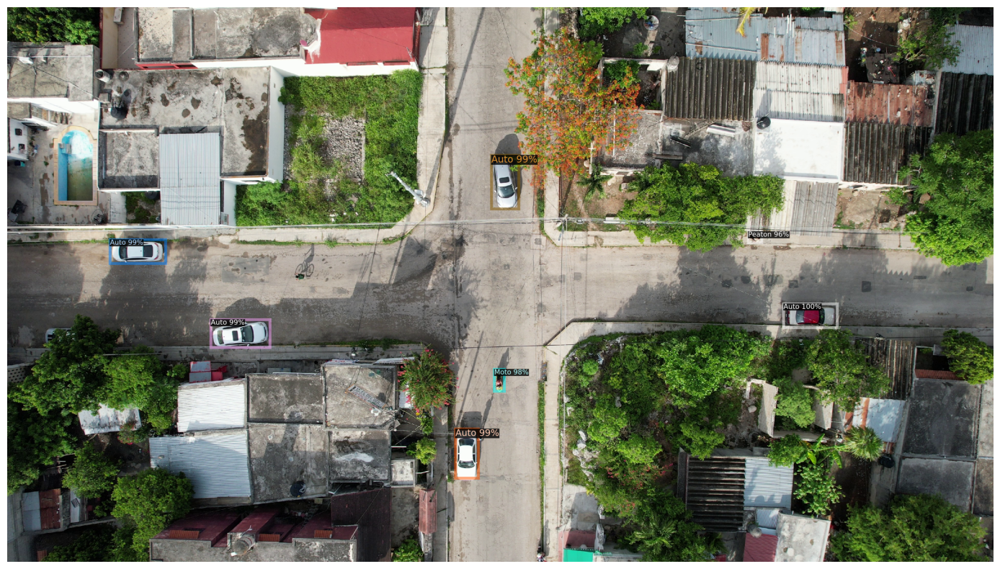

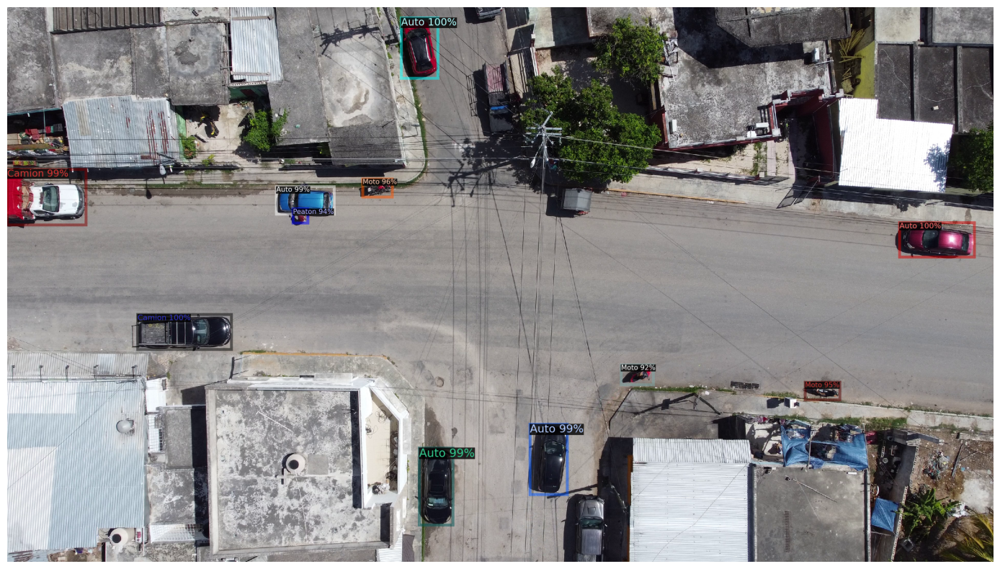

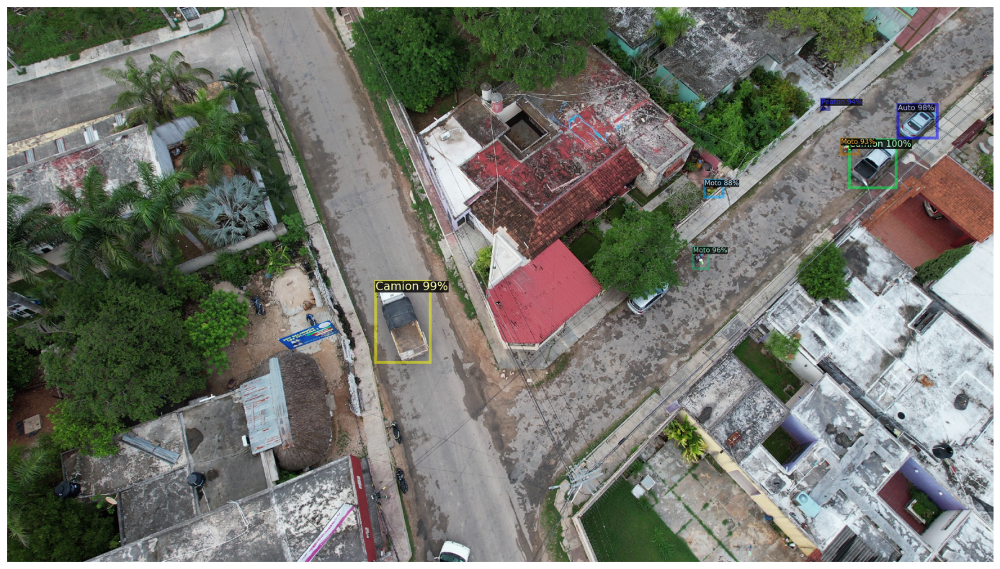

In [21]:
for d in random.sample(test_dataset_dicts, 3):
#for imageName in random.choices(test_imgs, k=3):
    print()
    #im = cv2.imread(imageName)
    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                metadata=my_dataset_test_metadata, 
                scale=0.8
                 )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #cv2_imshow(out.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()